In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import LabelEncoder

In [ ]:
file_path = "/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/bank_data.csv"
bank_data = pd.read_csv(file_path)

In [ ]:
pre_bank_data = pd.read_csv("/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/pre_bank_data.csv")

In [ ]:
bank_data.shape

(307511, 122)

In [ ]:
pre_bank_data.shape

(1670214, 37)

In [ ]:
bank_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [ ]:
pre_bank_data.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
bank_data.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [ ]:
pre_bank_data.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [ ]:
null_data1 = bank_data.isnull().sum()/307511*100

In [ ]:
print(null_data1)

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [ ]:
threshold = 40
drop_col1 = null_data1[null_data1 > threshold].index

In [ ]:
drop_col1.size

49

In [ ]:
bank_data_filtered = bank_data.drop(columns=drop_col1)

In [ ]:
bank_data.shape

(307511, 122)

In [ ]:
bank_data_filtered.shape

(307511, 73)

In [ ]:
bank_data_filtered.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
columns_drop = ['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                   'FLAG_EMAIL', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
                   'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10',
                   'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
                   'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
                   'FLAG_DOCUMENT_21', 'EXT_SOURCE_2', 'EXT_SOURCE_3']

bank_data_filtered = bank_data_filtered.drop(columns=columns_drop)

In [ ]:
bank_data_filtered.shape

(307511, 45)

In [ ]:
bank_data_filtered.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,2.0,0.0,2.0,0.0,-617.0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.0,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
columns_convert = ['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']

bank_data_filtered[columns_convert] = bank_data_filtered[columns_convert].abs()

In [ ]:
bank_data_filtered[columns_convert].describe()

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE
count,307511.000000,307511.000000,307511.000000,307511.000000,307510.000000
mean,16036.995067,67724.742149,4986.120328,2994.202373,962.858788
std,4363.988632,139443.751806,3522.886321,1509.450419,826.808487
min,7489.000000,0.000000,0.000000,0.000000,0.000000
25%,12413.000000,933.000000,2010.000000,1720.000000,274.000000
50%,15750.000000,2219.000000,4504.000000,3254.000000,757.000000
75%,19682.000000,5707.000000,7479.500000,4299.000000,1570.000000
max,25229.000000,365243.000000,24672.000000,7197.000000,4292.000000


In [ ]:
bank_data_filtered.isnull().sum().sort_values(ascending=True)

SK_ID_CURR                         0
REG_REGION_NOT_LIVE_REGION         0
HOUR_APPR_PROCESS_START            0
WEEKDAY_APPR_PROCESS_START         0
REGION_RATING_CLIENT_W_CITY        0
REGION_RATING_CLIENT               0
REG_CITY_NOT_LIVE_CITY             0
REG_CITY_NOT_WORK_CITY             0
DAYS_ID_PUBLISH                    0
DAYS_REGISTRATION                  0
DAYS_EMPLOYED                      0
DAYS_BIRTH                         0
REGION_POPULATION_RELATIVE         0
NAME_HOUSING_TYPE                  0
NAME_FAMILY_STATUS                 0
NAME_EDUCATION_TYPE                0
NAME_INCOME_TYPE                   0
LIVE_CITY_NOT_WORK_CITY            0
ORGANIZATION_TYPE                  0
AMT_CREDIT                         0
AMT_INCOME_TOTAL                   0
CNT_CHILDREN                       0
FLAG_OWN_REALTY                    0
FLAG_OWN_CAR                       0
CODE_GENDER                        0
NAME_CONTRACT_TYPE                 0
TARGET                             0
R

In [ ]:
bank_data_filtered['DAYS_LAST_PHONE_CHANGE'].describe()

count    307510.000000
mean        962.858788
std         826.808487
min           0.000000
25%         274.000000
50%         757.000000
75%        1570.000000
max        4292.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [ ]:
bank_data_filtered['DAYS_LAST_PHONE_CHANGE'].head()

0    1134.0
1     828.0
2     815.0
3     617.0
4    1106.0
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [ ]:
bank_data_filtered['DAYS_LAST_PHONE_CHANGE'].fillna(963, inplace=True)

In [ ]:
bank_data_filtered.isnull().sum().sort_values(ascending=True)

SK_ID_CURR                         0
REG_REGION_NOT_LIVE_REGION         0
HOUR_APPR_PROCESS_START            0
WEEKDAY_APPR_PROCESS_START         0
REGION_RATING_CLIENT_W_CITY        0
REGION_RATING_CLIENT               0
REG_CITY_NOT_LIVE_CITY             0
REG_CITY_NOT_WORK_CITY             0
DAYS_ID_PUBLISH                    0
DAYS_REGISTRATION                  0
DAYS_EMPLOYED                      0
DAYS_BIRTH                         0
REGION_POPULATION_RELATIVE         0
NAME_HOUSING_TYPE                  0
NAME_FAMILY_STATUS                 0
NAME_EDUCATION_TYPE                0
NAME_INCOME_TYPE                   0
LIVE_CITY_NOT_WORK_CITY            0
ORGANIZATION_TYPE                  0
DAYS_LAST_PHONE_CHANGE             0
AMT_CREDIT                         0
AMT_INCOME_TOTAL                   0
CNT_CHILDREN                       0
FLAG_OWN_REALTY                    0
FLAG_OWN_CAR                       0
CODE_GENDER                        0
NAME_CONTRACT_TYPE                 0
T

In [ ]:
bank_data_filtered['CNT_FAM_MEMBERS'].head()

0    1.0
1    2.0
2    1.0
3    2.0
4    1.0
Name: CNT_FAM_MEMBERS, dtype: float64

In [ ]:
bank_data_filtered['CNT_FAM_MEMBERS'].describe()

count    307509.000000
mean          2.152665
std           0.910682
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64

In [ ]:
bank_data_filtered.groupby('CNT_FAM_MEMBERS').size()

CNT_FAM_MEMBERS
1.0      67847
2.0     158357
3.0      52601
4.0      24697
5.0       3478
6.0        408
7.0         81
8.0         20
9.0          6
10.0         3
11.0         1
12.0         2
13.0         1
14.0         2
15.0         1
16.0         2
20.0         2
dtype: int64

In [ ]:
bank_data_filtered['CNT_FAM_MEMBERS'].fillna(2, inplace=True)

In [ ]:
bank_data_filtered.isnull().sum().sort_values(ascending=True)

SK_ID_CURR                         0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
REGION_RATING_CLIENT               0
REGION_RATING_CLIENT_W_CITY        0
WEEKDAY_APPR_PROCESS_START         0
HOUR_APPR_PROCESS_START            0
DAYS_EMPLOYED                      0
REG_REGION_NOT_LIVE_REGION         0
LIVE_REGION_NOT_WORK_REGION        0
REG_CITY_NOT_LIVE_CITY             0
REG_CITY_NOT_WORK_CITY             0
LIVE_CITY_NOT_WORK_CITY            0
ORGANIZATION_TYPE                  0
DAYS_LAST_PHONE_CHANGE             0
REG_REGION_NOT_WORK_REGION         0
DAYS_BIRTH                         0
CNT_FAM_MEMBERS                    0
NAME_HOUSING_TYPE                  0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
REGION_POPULATION_RELATIVE         0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
F

In [ ]:
bank_data_filtered['AMT_ANNUITY'].head(10)

0    24700.5
1    35698.5
2     6750.0
3    29686.5
4    21865.5
5    27517.5
6    41301.0
7    42075.0
8    33826.5
9    20250.0
Name: AMT_ANNUITY, dtype: float64

In [ ]:
bank_data_filtered['AMT_ANNUITY'].describe()

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [ ]:
bank_data_filtered['AMT_ANNUITY'].fillna(27108.5, inplace=True)

In [ ]:
bank_data_filtered['AMT_ANNUITY'].isnull().sum()

0

In [ ]:
bank_data_filtered['AMT_GOODS_PRICE'].describe()

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [ ]:
bank_data_filtered['AMT_GOODS_PRICE'].head(10)

0     351000.0
1    1129500.0
2     135000.0
3     297000.0
4     513000.0
5     454500.0
6    1395000.0
7    1530000.0
8     913500.0
9     405000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [ ]:
bank_data_filtered['AMT_GOODS_PRICE'].median()

450000.0

In [ ]:
bank_data_filtered['AMT_GOODS_PRICE'].mean()

538396.2074288895

In [ ]:
bank_data_filtered['AMT_GOODS_PRICE'].fillna(450000.0, inplace=True)

In [ ]:
bank_data_filtered['AMT_GOODS_PRICE'].isnull().sum()

0

In [ ]:
bank_data_filtered[['DEF_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE']].describe()

,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE
count,306490.000000,306490.000000,306490.000000,306490.000000
mean,0.100049,0.143421,1.405292,1.422245
std,0.362291,0.446698,2.379803,2.400989
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,2.000000,2.000000
max,24.000000,34.000000,344.000000,348.000000


In [ ]:
bank_data_filtered[['DEF_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE']].head()

,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE
0,2.0,2.0,2.0,2.0
1,0.0,0.0,1.0,1.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,2.0,2.0
4,0.0,0.0,0.0,0.0


In [ ]:
bank_data_filtered[['DEF_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE']].median()

DEF_60_CNT_SOCIAL_CIRCLE    0.0
DEF_30_CNT_SOCIAL_CIRCLE    0.0
OBS_60_CNT_SOCIAL_CIRCLE    0.0
OBS_30_CNT_SOCIAL_CIRCLE    0.0
dtype: float64

In [ ]:
bank_data_filtered['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(0, inplace=True)
bank_data_filtered['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(0, inplace=True)
bank_data_filtered['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(1, inplace=True)
bank_data_filtered['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(1, inplace=True)

In [ ]:
bank_data_filtered[['DEF_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE']].isnull().sum()

DEF_60_CNT_SOCIAL_CIRCLE    0
DEF_30_CNT_SOCIAL_CIRCLE    0
OBS_60_CNT_SOCIAL_CIRCLE    0
OBS_30_CNT_SOCIAL_CIRCLE    0
dtype: int64

In [ ]:
bank_data_filtered.isnull().sum().sort_values(ascending=True)

SK_ID_CURR                         0
REGION_RATING_CLIENT               0
REGION_RATING_CLIENT_W_CITY        0
WEEKDAY_APPR_PROCESS_START         0
HOUR_APPR_PROCESS_START            0
REG_REGION_NOT_LIVE_REGION         0
REG_REGION_NOT_WORK_REGION         0
LIVE_REGION_NOT_WORK_REGION        0
DAYS_ID_PUBLISH                    0
REG_CITY_NOT_LIVE_CITY             0
LIVE_CITY_NOT_WORK_CITY            0
ORGANIZATION_TYPE                  0
OBS_30_CNT_SOCIAL_CIRCLE           0
DEF_30_CNT_SOCIAL_CIRCLE           0
OBS_60_CNT_SOCIAL_CIRCLE           0
DEF_60_CNT_SOCIAL_CIRCLE           0
DAYS_LAST_PHONE_CHANGE             0
REG_CITY_NOT_WORK_CITY             0
DAYS_REGISTRATION                  0
CNT_FAM_MEMBERS                    0
DAYS_BIRTH                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
D

In [ ]:
bank_data_filtered['NAME_TYPE_SUITE'].head()

0    Unaccompanied
1           Family
2    Unaccompanied
3    Unaccompanied
4    Unaccompanied
Name: NAME_TYPE_SUITE, dtype: object

In [ ]:
bank_data_filtered.groupby('NAME_TYPE_SUITE').size()

NAME_TYPE_SUITE
Children             3267
Family              40149
Group of people       271
Other_A               866
Other_B              1770
Spouse, partner     11370
Unaccompanied      248526
dtype: int64

In [ ]:
bank_data_filtered['NAME_TYPE_SUITE'].describe()

count            306219
unique                7
top       Unaccompanied
freq             248526
Name: NAME_TYPE_SUITE, dtype: object

In [ ]:
bank_data_filtered['NAME_TYPE_SUITE'].fillna('Unaccompanied', inplace=True)

In [ ]:
bank_data_filtered['NAME_TYPE_SUITE'].isnull().sum()

0

In [ ]:
bank_data_filtered[['AMT_REQ_CREDIT_BUREAU_QRT',
'AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_DAY',
'AMT_REQ_CREDIT_BUREAU_WEEK',
'AMT_REQ_CREDIT_BUREAU_MON',
'AMT_REQ_CREDIT_BUREAU_YEAR']].describe()

,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
count,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,0.265474,0.006402,0.007000,0.034362,0.267395,1.899974
std,0.794056,0.083849,0.110757,0.204685,0.916002,1.869295
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,261.000000,4.000000,9.000000,8.000000,27.000000,25.000000


In [ ]:
bank_data_filtered[['AMT_REQ_CREDIT_BUREAU_QRT',
'AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_DAY',
'AMT_REQ_CREDIT_BUREAU_WEEK',
'AMT_REQ_CREDIT_BUREAU_MON',
'AMT_REQ_CREDIT_BUREAU_YEAR']].mode()

,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
bank_data_filtered[['AMT_REQ_CREDIT_BUREAU_QRT',
'AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_DAY',
'AMT_REQ_CREDIT_BUREAU_WEEK',
'AMT_REQ_CREDIT_BUREAU_MON',
'AMT_REQ_CREDIT_BUREAU_YEAR']].head()

,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0
3,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
bank_data_filtered['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(0, inplace=True)
bank_data_filtered['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(0, inplace=True)
bank_data_filtered['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(0, inplace=True)
bank_data_filtered['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(0, inplace=True)
bank_data_filtered['AMT_REQ_CREDIT_BUREAU_MON'].fillna(0, inplace=True)
bank_data_filtered['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(0, inplace=True)

In [ ]:
bank_data_filtered[['AMT_REQ_CREDIT_BUREAU_QRT',
'AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_DAY',
'AMT_REQ_CREDIT_BUREAU_WEEK',
'AMT_REQ_CREDIT_BUREAU_MON',
'AMT_REQ_CREDIT_BUREAU_YEAR']].isnull().sum()

AMT_REQ_CREDIT_BUREAU_QRT     0
AMT_REQ_CREDIT_BUREAU_HOUR    0
AMT_REQ_CREDIT_BUREAU_DAY     0
AMT_REQ_CREDIT_BUREAU_WEEK    0
AMT_REQ_CREDIT_BUREAU_MON     0
AMT_REQ_CREDIT_BUREAU_YEAR    0
dtype: int64

In [ ]:
bank_data_filtered['OCCUPATION_TYPE'].describe()

count       211120
unique          18
top       Laborers
freq         55186
Name: OCCUPATION_TYPE, dtype: object

In [ ]:
bank_data_filtered.groupby('OCCUPATION_TYPE').size()

OCCUPATION_TYPE
Accountants               9813
Cleaning staff            4653
Cooking staff             5946
Core staff               27570
Drivers                  18603
HR staff                   563
High skill tech staff    11380
IT staff                   526
Laborers                 55186
Low-skill Laborers        2093
Managers                 21371
Medicine staff            8537
Private service staff     2652
Realty agents              751
Sales staff              32102
Secretaries               1305
Security staff            6721
Waiters/barmen staff      1348
dtype: int64

In [ ]:
bank_data_filtered['OCCUPATION_TYPE'].fillna('Laborers', inplace=True)

In [ ]:
bank_data_filtered['OCCUPATION_TYPE'].isnull().sum()

0

In [ ]:
bank_data_filtered.isnull().sum().sort_values(ascending=True)

SK_ID_CURR                     0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
REG_REGION_NOT_LIVE_REGION     0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
REG_CITY_NOT_WORK_CITY         0
LIVE_CITY_NOT_WORK_CITY        0
ORGANIZATION_TYPE              0
OBS_30_CNT_SOCIAL_CIRCLE       0
DEF_30_CNT_SOCIAL_CIRCLE       0
OBS_60_CNT_SOCIAL_CIRCLE       0
DEF_60_CNT_SOCIAL_CIRCLE       0
DAYS_LAST_PHONE_CHANGE         0
AMT_REQ_CREDIT_BUREAU_HOUR     0
AMT_REQ_CREDIT_BUREAU_DAY      0
AMT_REQ_CREDIT_BUREAU_WEEK     0
AMT_REQ_CREDIT_BUREAU_MON      0
REGION_RATING_CLIENT           0
AMT_REQ_CREDIT_BUREAU_QRT      0
CNT_FAM_MEMBERS                0
DAYS_ID_PUBLISH                0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME

In [ ]:
bank_data_filtered.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,19005,3039,9833.0,2437,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,2.0,0.0,2.0,0.0,617.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,19932,3038,4311.0,3458,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.0,0.0,0.0,0.0,1106.0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,16941,1588,4970.0,477,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.0,0.0,0.0,0.0,2536.0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,Cash loans,F,Y,Y,1,171000.0,1560726.0,41301.0,1395000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.035792,13778,3130,1213.0,619,Accountants,3.0,2,2,SUNDAY,16,0,0,0,0,0,0,Business Entity Type 3,1.0,0.0,1.0,0.0,1562.0,0.0,0.0,0.0,1.0,1.0,2.0
7,100010,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,Unaccompanied,State servant,Higher education,Married,House / apartment,0.003122,18850,449,4597.0,2379,Managers,2.0,3,3,MONDAY,16,0,0,0,0,1,1,Other,2.0,0.0,2.0,0.0,1070.0,0.0,0.0,0.0,0.0,0.0,0.0
8,100011,0,Cash loans,F,N,Y,0,112500.0,1019610.0,33826.5,913500.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.018634,20099,365243,7427.0,3514,Laborers,2.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,XNA,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,100012,0,Revolving loans,M,N,Y,0,135000.0,405000.0,20250.0,405000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.019689,14469,2019,14437.0,3992,Laborers,1.0,2,2,THURSDAY,8,0,0,0,0,0,0,Electricity,2.0,0.0,2.0,0.0,1673.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
bank_data_filtered.nunique().sort_values()

LIVE_REGION_NOT_WORK_REGION         2
TARGET                              2
NAME_CONTRACT_TYPE                  2
FLAG_OWN_CAR                        2
FLAG_OWN_REALTY                     2
REG_REGION_NOT_LIVE_REGION          2
REG_CITY_NOT_LIVE_CITY              2
REG_CITY_NOT_WORK_CITY              2
LIVE_CITY_NOT_WORK_CITY             2
REG_REGION_NOT_WORK_REGION          2
CODE_GENDER                         3
REGION_RATING_CLIENT_W_CITY         3
REGION_RATING_CLIENT                3
AMT_REQ_CREDIT_BUREAU_HOUR          5
NAME_EDUCATION_TYPE                 5
NAME_FAMILY_STATUS                  6
NAME_HOUSING_TYPE                   6
NAME_TYPE_SUITE                     7
WEEKDAY_APPR_PROCESS_START          7
NAME_INCOME_TYPE                    8
DEF_60_CNT_SOCIAL_CIRCLE            9
AMT_REQ_CREDIT_BUREAU_DAY           9
AMT_REQ_CREDIT_BUREAU_WEEK          9
DEF_30_CNT_SOCIAL_CIRCLE           10
AMT_REQ_CREDIT_BUREAU_QRT          11
CNT_CHILDREN                       15
CNT_FAM_MEMB

In [ ]:
bank_data_filtered.dtypes

SK_ID_CURR                       int64
TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
REGION_POPULATION_RELATIVE     float64
DAYS_BIRTH                       int64
DAYS_EMPLOYED                    int64
DAYS_REGISTRATION              float64
DAYS_ID_PUBLISH                  int64
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT             int64
REGION_RATING_CLIENT_W_CITY      int64
WEEKDAY_APPR_PROCESS_STAR

In [ ]:
#bank_data_filtered.to_csv('/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/bank_data_filtered.csv', index=False)

In [ ]:
pre_bank_data.shape

(1670214, 37)

In [ ]:
pre_bank_data.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
null_data2 = pre_bank_data.isnull().sum()/1670214*100

In [ ]:
null_data2

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [ ]:
threshold = 40
drop_col2 = null_data2[null_data2 > threshold].index

In [ ]:
drop_col2.size

11

In [ ]:
pre_bank_data_filtered = pre_bank_data.drop(columns=drop_col2)

In [ ]:
pre_bank_data_filtered.shape

(1670214, 26)

In [ ]:
pre_bank_data_filtered.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high


In [ ]:
columns_drop1 = ['WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT',
                'NFLAG_LAST_APPL_IN_DAY']

pre_bank_data_filtered = pre_bank_data_filtered.drop(columns=columns_drop1)

In [ ]:
pre_bank_data_filtered.shape

(1670214, 22)

In [ ]:
pre_bank_data_filtered.head(10)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,XAP,Approved,-73,Cash through the bank,XAP,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,XNA,Approved,-164,XNA,XAP,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,XNA,Approved,-301,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,XNA,Approved,-512,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,Repairs,Refused,-781,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,315000.0,Everyday expenses,Approved,-684,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,18.0,low_normal,Cash X-Sell: low
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,XNA,Canceled,-14,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,XNA,Canceled,-21,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,XNA,Canceled,-386,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,XNA,Canceled,-57,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash


In [ ]:
columns_convert1 = ['DAYS_DECISION']

pre_bank_data_filtered[columns_convert1] = pre_bank_data_filtered[columns_convert1].abs()

In [ ]:
pre_bank_data_filtered[columns_convert1].describe()

,DAYS_DECISION
count,1.670214e+06
mean,8.806797e+02
std,7.790997e+02
min,1.000000e+00
25%,2.800000e+02
50%,5.810000e+02
75%,1.300000e+03
max,2.922000e+03


In [ ]:
pre_bank_data_filtered.isnull().sum().sort_values(ascending=True)

SK_ID_PREV                     0
NAME_SELLER_INDUSTRY           0
SELLERPLACE_AREA               0
CHANNEL_TYPE                   0
NAME_PRODUCT_TYPE              0
NAME_PORTFOLIO                 0
NAME_GOODS_CATEGORY            0
NAME_CLIENT_TYPE               0
CODE_REJECT_REASON             0
NAME_YIELD_GROUP               0
NAME_PAYMENT_TYPE              0
NAME_CONTRACT_STATUS           0
NAME_CASH_LOAN_PURPOSE         0
AMT_APPLICATION                0
NAME_CONTRACT_TYPE             0
SK_ID_CURR                     0
DAYS_DECISION                  0
AMT_CREDIT                     1
PRODUCT_COMBINATION          346
CNT_PAYMENT               372230
AMT_ANNUITY               372235
AMT_GOODS_PRICE           385515
dtype: int64

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].describe()

count    1.670213e+06
mean     1.961140e+05
std      3.185746e+05
min      0.000000e+00
25%      2.416050e+04
50%      8.054100e+04
75%      2.164185e+05
max      6.905160e+06
Name: AMT_CREDIT, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].median()

80541.0

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].mode()

0    0.0
Name: AMT_CREDIT, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].mean()

196114.0212179794

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].head(10)

0     17145.0
1    679671.0
2    136444.5
3    470790.0
4    404055.0
5    340573.5
6         0.0
7         0.0
8         0.0
9         0.0
Name: AMT_CREDIT, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].fillna(0.0, inplace=True)

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].isnull().sum()

0

In [ ]:
pre_bank_data_filtered['PRODUCT_COMBINATION'].head(10)

0    POS mobile with interest
1            Cash X-Sell: low
2           Cash X-Sell: high
3         Cash X-Sell: middle
4           Cash Street: high
5            Cash X-Sell: low
6                        Cash
7                        Cash
8                        Cash
9                        Cash
Name: PRODUCT_COMBINATION, dtype: object

In [ ]:
pre_bank_data_filtered['PRODUCT_COMBINATION'].describe()

count     1669868
unique         17
top          Cash
freq       285990
Name: PRODUCT_COMBINATION, dtype: object

In [ ]:
pre_bank_data_filtered['PRODUCT_COMBINATION'].fillna('Cash', inplace=True)

In [ ]:
pre_bank_data_filtered['AMT_CREDIT'].isnull().sum()

0

In [ ]:
pre_bank_data_filtered['CNT_PAYMENT'].describe()

count    1.297984e+06
mean     1.605408e+01
std      1.456729e+01
min      0.000000e+00
25%      6.000000e+00
50%      1.200000e+01
75%      2.400000e+01
max      8.400000e+01
Name: CNT_PAYMENT, dtype: float64

In [ ]:
pre_bank_data_filtered['CNT_PAYMENT'].head(10)

0    12.0
1    36.0
2    12.0
3    12.0
4    24.0
5    18.0
6     NaN
7     NaN
8     NaN
9     NaN
Name: CNT_PAYMENT, dtype: float64

In [ ]:
pre_bank_data_filtered['CNT_PAYMENT'].median()

12.0

In [ ]:
pre_bank_data_filtered['CNT_PAYMENT'].mode()

0    12.0
Name: CNT_PAYMENT, dtype: float64

In [ ]:
pre_bank_data_filtered['CNT_PAYMENT'].mean()

16.0540815603274

In [ ]:
pre_bank_data_filtered['CNT_PAYMENT'].fillna(12.0, inplace=True)

In [ ]:
pre_bank_data_filtered['CNT_PAYMENT'].isnull().sum()

0

In [ ]:
pre_bank_data_filtered['AMT_ANNUITY'].describe()

count    1.297979e+06
mean     1.595512e+04
std      1.478214e+04
min      0.000000e+00
25%      6.321780e+03
50%      1.125000e+04
75%      2.065842e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_ANNUITY'].head()

0     1730.430
1    25188.615
2    15060.735
3    47041.335
4    31924.395
Name: AMT_ANNUITY, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_ANNUITY'].median()

11250.0

In [ ]:
pre_bank_data_filtered['AMT_ANNUITY'].mode()

0    2250.0
Name: AMT_ANNUITY, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_ANNUITY'].mean()

15955.120659452119

In [ ]:
pre_bank_data_filtered['AMT_ANNUITY'].fillna(11250.0, inplace=True)

In [ ]:
pre_bank_data_filtered['AMT_ANNUITY'].isnull().sum()

0

In [ ]:
pre_bank_data_filtered['AMT_GOODS_PRICE'].describe()

count    1.284699e+06
mean     2.278473e+05
std      3.153966e+05
min      0.000000e+00
25%      5.084100e+04
50%      1.123200e+05
75%      2.340000e+05
max      6.905160e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_GOODS_PRICE'].head()

0     17145.0
1    607500.0
2    112500.0
3    450000.0
4    337500.0
Name: AMT_GOODS_PRICE, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_GOODS_PRICE'].median()

112320.0

In [ ]:
pre_bank_data_filtered['AMT_GOODS_PRICE'].mode()

0    45000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [ ]:
pre_bank_data_filtered['AMT_GOODS_PRICE'].mean()

227847.27928334562

In [ ]:
pre_bank_data_filtered['AMT_GOODS_PRICE'].fillna(112320.0, inplace=True)

In [ ]:
pre_bank_data_filtered['AMT_GOODS_PRICE'].isnull().sum()

0

In [ ]:
pre_bank_data_filtered.isnull().sum().sort_values(ascending=True)

SK_ID_PREV                0
CNT_PAYMENT               0
NAME_SELLER_INDUSTRY      0
SELLERPLACE_AREA          0
CHANNEL_TYPE              0
NAME_PRODUCT_TYPE         0
NAME_PORTFOLIO            0
NAME_GOODS_CATEGORY       0
NAME_CLIENT_TYPE          0
CODE_REJECT_REASON        0
NAME_PAYMENT_TYPE         0
DAYS_DECISION             0
NAME_CONTRACT_STATUS      0
NAME_CASH_LOAN_PURPOSE    0
AMT_GOODS_PRICE           0
AMT_CREDIT                0
AMT_APPLICATION           0
AMT_ANNUITY               0
NAME_CONTRACT_TYPE        0
SK_ID_CURR                0
NAME_YIELD_GROUP          0
PRODUCT_COMBINATION       0
dtype: int64

In [ ]:
#pre_bank_data_filtered.to_csv('/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/pre_bank_filtered.csv', index=False)

In [ ]:
file_path = "/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/bank_superclean.csv"
bank_data = pd.read_csv(file_path)
bank_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,2.0,0.0,617.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,1106.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Đọc dữ liệu từ tệp CSV
df_num = pd.read_csv('/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/bank_superclean.csv')

# Lặp qua tất cả các cột kiểu object và áp dụng LabelEncoder
label_encoder = LabelEncoder()
for column in df_num.select_dtypes(include=['object']).columns:
    df_num[column] = label_encoder.fit_transform(df_num[column])

# Lưu dữ liệu đã xử lý vào một tệp mới (nếu cần)
df_num.to_csv('/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/bank_clean_num', index=False)

In [ ]:
df_num.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,1,0,1,0,202500.0,406597.5,24700.5,...,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,0,0,0,0,270000.0,1293502.5,35698.5,...,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,1,1,1,1,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,0,0,1,0,135000.0,312682.5,29686.5,...,0.0,2.0,0.0,617.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,0,1,0,1,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,1106.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Xem tỉ lệ dữ liệu giữa TARGET = 1 và TARGET = 0
target_counts = df_num['TARGET'].value_counts()

# In ra tỉ lệ dữ liệu
print(target_counts)

target_percentage = df_num['TARGET'].value_counts(normalize=True) * 100
print(target_percentage)

0    282686
1     24825
Name: TARGET, dtype: int64
0    91.927118
1     8.072882
Name: TARGET, dtype: float64


In [ ]:
import pandas as pd
from sklearn.utils import resample

# Đọc dữ liệu từ file CSV của bạn
df = pd.read_csv('/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/bank_clean_num')

# Chia dữ liệu thành hai nhóm dựa trên giá trị của TARGET
df_target_0 = df[df['TARGET'] == 0]
df_target_1 = df[df['TARGET'] == 1]

# Giảm lượng dữ liệu của TARGET = 0 để đạt được tỷ lệ mong muốn
df_target_0_downsampled = resample(df_target_0, replace=False, n_samples=int(len(df_target_1) / 0.7 * 0.3), random_state=42)

# Kết hợp lại dữ liệu giảm lượng với dữ liệu TARGET = 1
df_downsampled = pd.concat([df_target_0_downsampled, df_target_1])

# In ra thông tin về số liệu mới
print(df_downsampled['TARGET'].value_counts())
df_downsampled.to_csv('/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/64bank_num_balenced.csv', index=False)

1    24825
0    10639
Name: TARGET, dtype: int64


In [ ]:
# In ra thông tin về số liệu mới
print("Tỷ lệ sau khi giảm lượng:")
print(df_downsampled['TARGET'].value_counts(normalize=True) * 100)


Tỷ lệ sau khi giảm lượng:
1    70.000564
0    29.999436
Name: TARGET, dtype: float64


In [ ]:
bank_data_filtered = pd.read_csv('/content/drive/MyDrive/KhaiPhaDuLieu/BTL/Data/64bank_num_balenced.csv')

In [ ]:
bank_data_filtered.dtypes.value_counts()

int64      27
float64    18
dtype: int64

In [ ]:
numerical_variables = bank_data_filtered.select_dtypes(include = ['float64', 'int64']).columns
numerical_columns = bank_data_filtered[numerical_variables]
payment_difficulty = numerical_columns[numerical_columns['TARGET']==1]
all_other = numerical_columns[numerical_columns['TARGET']==0]

In [ ]:
payment_difficulty.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
10639,100002,1,0,1,0,1,0,202500.0,406597.5,24700.5,...,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0
10640,100031,1,0,0,0,1,0,112500.0,979992.0,27076.5,...,1.0,10.0,0.0,161.0,0.0,0.0,0.0,0.0,2.0,2.0
10641,100047,1,0,1,0,1,0,202500.0,1193580.0,35028.0,...,0.0,0.0,0.0,1075.0,0.0,0.0,0.0,2.0,0.0,4.0
10642,100049,1,0,0,0,0,0,135000.0,288873.0,16258.5,...,0.0,1.0,0.0,1480.0,0.0,0.0,0.0,0.0,0.0,2.0
10643,100096,1,0,0,0,1,0,81000.0,252000.0,14593.5,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10644,100112,1,0,1,1,1,0,315000.0,953460.0,64107.0,...,0.0,0.0,0.0,591.0,0.0,0.0,0.0,0.0,0.0,2.0
10645,100130,1,0,0,0,1,1,157500.0,723996.0,30802.5,...,0.0,0.0,0.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0
10646,100160,1,0,1,0,1,0,292500.0,675000.0,36747.0,...,0.0,0.0,0.0,106.0,0.0,0.0,0.0,0.0,0.0,0.0
10647,100181,1,0,0,0,1,0,157500.0,245619.0,12667.5,...,0.0,0.0,0.0,216.0,0.0,0.0,0.0,0.0,0.0,6.0
10648,100192,1,0,0,0,0,0,111915.0,225000.0,21037.5,...,0.0,0.0,0.0,122.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
all_other.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,333721,0,0,1,1,1,1,292500.0,1102500.0,32364.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,110157,0,1,0,0,1,0,270000.0,720000.0,36000.0,...,0.0,0.0,0.0,135.0,0.0,0.0,0.0,1.0,0.0,2.0
2,276815,0,1,0,1,1,1,135000.0,360000.0,18000.0,...,0.0,0.0,0.0,1585.0,0.0,0.0,0.0,0.0,0.0,0.0
3,353213,0,0,0,1,0,0,90000.0,225000.0,10426.5,...,0.0,0.0,0.0,349.0,0.0,0.0,0.0,1.0,0.0,6.0
4,447111,0,0,0,0,0,0,283500.0,1800000.0,51718.5,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0
5,427556,0,0,0,0,0,1,225000.0,508495.5,21541.5,...,0.0,3.0,0.0,1712.0,0.0,0.0,0.0,0.0,1.0,5.0
6,109506,0,1,0,0,1,2,135000.0,270000.0,13500.0,...,0.0,0.0,0.0,201.0,0.0,0.0,0.0,0.0,0.0,0.0
7,192184,0,0,0,0,1,0,90000.0,281493.0,12055.5,...,0.0,0.0,0.0,1110.0,0.0,0.0,0.0,0.0,2.0,4.0
8,277245,0,0,1,1,1,2,180000.0,1078200.0,34911.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,379974,0,0,0,0,0,0,67500.0,454500.0,21865.5,...,2.0,4.0,2.0,792.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
correlations_with_target_1 = payment_difficulty.corr()
top_10_correlations_with_target_1 = correlations_with_target_1.unstack().sort_values(ascending=False)
top_10_correlations_with_target_1 = top_10_correlations_with_target_1[top_10_correlations_with_target_1.index.get_level_values(0) != top_10_correlations_with_target_1.index.get_level_values(1)]
top_10_correlations_with_target_1 = top_10_correlations_with_target_1.head(20)


top_10_correlations_with_target_1

OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998269
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE       0.998269
AMT_CREDIT                   AMT_GOODS_PRICE                0.982783
AMT_GOODS_PRICE              AMT_CREDIT                     0.982783
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956637
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.956637
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.885484
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.885484
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.869016
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.869016
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.847885
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.847885
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.778540
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.778540
AMT_ANNUITY                  AMT_G

In [ ]:
correlations_with_target_0 = all_other.corr()
top_10_correlations_with_target_0 = correlations_with_target_0.unstack().sort_values(ascending=False)
top_10_correlations_with_target_0 = top_10_correlations_with_target_0[top_10_correlations_with_target_0.index.get_level_values(0) != top_10_correlations_with_target_0.index.get_level_values(1)]
top_10_correlations_with_target_0 = top_10_correlations_with_target_0.head(20)

top_10_correlations_with_target_0

OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998121
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE       0.998121
AMT_GOODS_PRICE              AMT_CREDIT                     0.987162
AMT_CREDIT                   AMT_GOODS_PRICE                0.987162
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.948292
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.948292
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.879532
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.879532
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.864730
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.864730
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.842770
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.842770
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.831312
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.831312
AMT_GOODS_PRICE              AMT_A

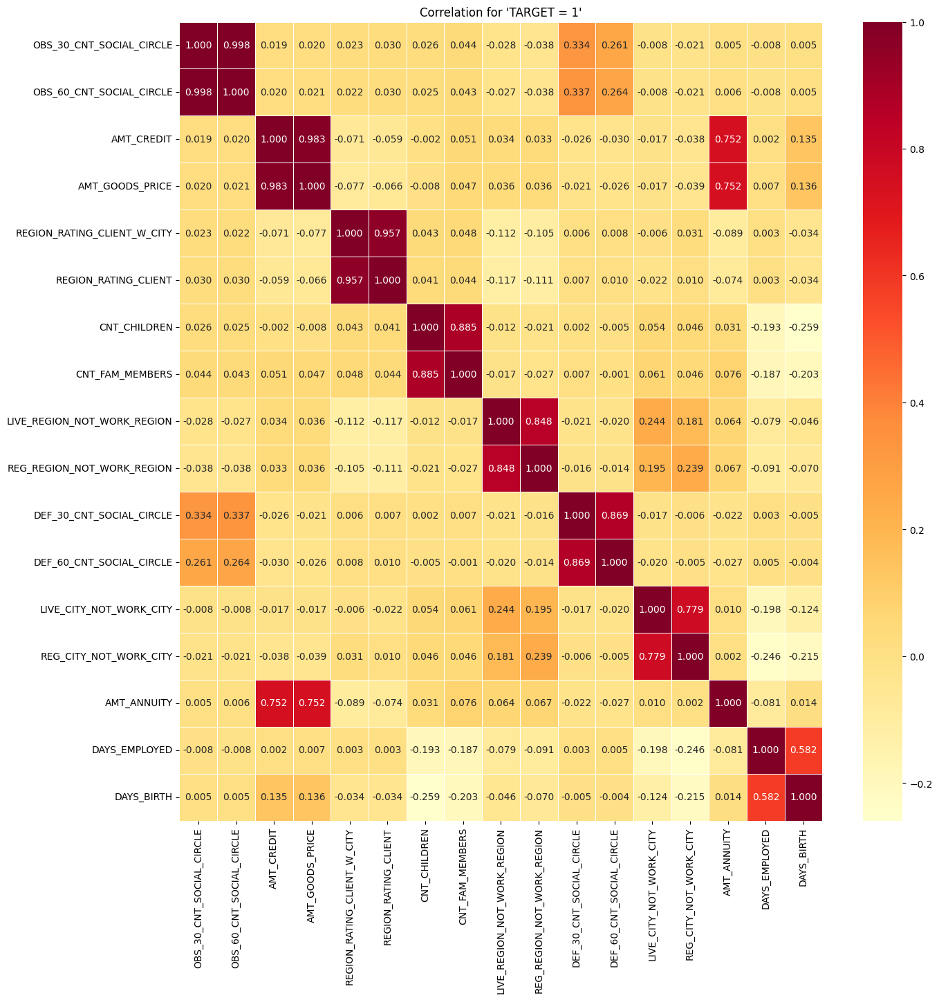

In [ ]:
columns = ['OBS_30_CNT_SOCIAL_CIRCLE',
'OBS_60_CNT_SOCIAL_CIRCLE',
'AMT_CREDIT',
'AMT_GOODS_PRICE',
'REGION_RATING_CLIENT_W_CITY',
'REGION_RATING_CLIENT',
'CNT_CHILDREN',
'CNT_FAM_MEMBERS',
'LIVE_REGION_NOT_WORK_REGION',
'REG_REGION_NOT_WORK_REGION',
'DEF_30_CNT_SOCIAL_CIRCLE',
'DEF_60_CNT_SOCIAL_CIRCLE',
'LIVE_CITY_NOT_WORK_CITY',
'REG_CITY_NOT_WORK_CITY',
'AMT_ANNUITY',
'DAYS_EMPLOYED',
'DAYS_BIRTH']

selected_columns = payment_difficulty[columns]
correlation_matrix = selected_columns.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='YlOrRd', fmt='.3f', linewidths=0.5)
plt.title("Correlation for 'TARGET = 1'")
plt.show()

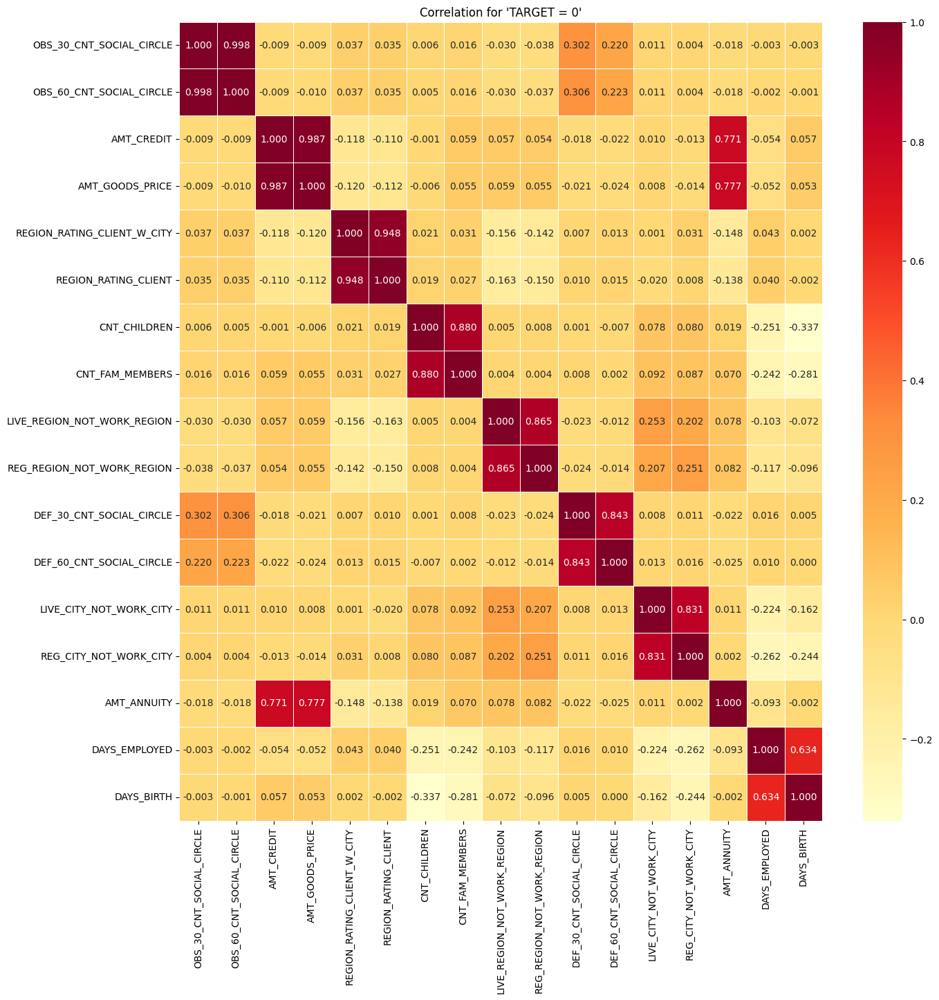

In [ ]:
columns = ['OBS_30_CNT_SOCIAL_CIRCLE',
'OBS_60_CNT_SOCIAL_CIRCLE',
'AMT_CREDIT',
'AMT_GOODS_PRICE',
'REGION_RATING_CLIENT_W_CITY',
'REGION_RATING_CLIENT',
'CNT_CHILDREN',
'CNT_FAM_MEMBERS',
'LIVE_REGION_NOT_WORK_REGION',
'REG_REGION_NOT_WORK_REGION',
'DEF_30_CNT_SOCIAL_CIRCLE',
'DEF_60_CNT_SOCIAL_CIRCLE',
'LIVE_CITY_NOT_WORK_CITY',
'REG_CITY_NOT_WORK_CITY',
'AMT_ANNUITY',
'DAYS_EMPLOYED',
'DAYS_BIRTH']

selected_columns = all_other[columns]
correlation_matrix = selected_columns.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='YlOrRd', fmt='.3f', linewidths=0.5)
plt.title("Correlation for 'TARGET = 0'")
plt.show()

In [ ]:
bank_data_filtered.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,333721,0,0,1,1,1,1,292500.0,1102500.0,32364.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,110157,0,1,0,0,1,0,270000.0,720000.0,36000.0,...,0.0,0.0,0.0,135.0,0.0,0.0,0.0,1.0,0.0,2.0
2,276815,0,1,0,1,1,1,135000.0,360000.0,18000.0,...,0.0,0.0,0.0,1585.0,0.0,0.0,0.0,0.0,0.0,0.0
3,353213,0,0,0,1,0,0,90000.0,225000.0,10426.5,...,0.0,0.0,0.0,349.0,0.0,0.0,0.0,1.0,0.0,6.0
4,447111,0,0,0,0,0,0,283500.0,1800000.0,51718.5,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
cols = ['OBS_30_CNT_SOCIAL_CIRCLE',
'OBS_60_CNT_SOCIAL_CIRCLE',
'AMT_CREDIT',
'AMT_GOODS_PRICE',
'REGION_RATING_CLIENT_W_CITY',
'REGION_RATING_CLIENT',
'CNT_CHILDREN',
'CNT_FAM_MEMBERS',
'LIVE_REGION_NOT_WORK_REGION',
'REG_REGION_NOT_WORK_REGION',
'DEF_30_CNT_SOCIAL_CIRCLE',
'DEF_60_CNT_SOCIAL_CIRCLE',
'LIVE_CITY_NOT_WORK_CITY',
'REG_CITY_NOT_WORK_CITY',
'AMT_ANNUITY',
'DAYS_EMPLOYED',
'DAYS_BIRTH', 'ORGANIZATION_TYPE', 'TARGET']

selected_df = bank_data_filtered[cols]

print(selected_df)

       OBS_30_CNT_SOCIAL_CIRCLE  OBS_60_CNT_SOCIAL_CIRCLE  AMT_CREDIT  \
0                           1.0                       1.0   1102500.0   
1                           0.0                       0.0    720000.0   
2                           0.0                       0.0    360000.0   
3                           0.0                       0.0    225000.0   
4                           0.0                       0.0   1800000.0   
...                         ...                       ...         ...   
35459                       0.0                       0.0    450000.0   
35460                       0.0                       0.0   1303200.0   
35461                       0.0                       0.0    297000.0   
35462                       1.0                       1.0    521280.0   
35463                       0.0                       0.0    370107.0   

       AMT_GOODS_PRICE  REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT  \
0            1102500.0                        

In [ ]:
import pandas as pd
# Chia tập dữ liệu thành tập train (80%) và tập test (20%):
from sklearn.model_selection import train_test_split

df = selected_df

X = df.drop('TARGET', axis=1)
y = df['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)

In [ ]:
# Xây dựng mô hình KNN với K lần lượt là 3, 5, 7, 9 trên tập train:
from sklearn.neighbors import KNeighborsClassifier

knn_3 = KNeighborsClassifier(n_neighbors=3)
knn_5 = KNeighborsClassifier(n_neighbors=5)
knn_7 = KNeighborsClassifier(n_neighbors=7)
knn_9 = KNeighborsClassifier(n_neighbors=9)
knn_11 = KNeighborsClassifier(n_neighbors=11)
knn_13 = KNeighborsClassifier(n_neighbors=13)
knn_15 = KNeighborsClassifier(n_neighbors=15)


knn_3.fit(X_train, y_train)
knn_5.fit(X_train, y_train)
knn_7.fit(X_train, y_train)
knn_9.fit(X_train, y_train)
knn_11.fit(X_train, y_train)
knn_13.fit(X_train, y_train)
knn_15.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=15)

In [ ]:
# Đánh giá mô hình trên tập test:
y_pred_3 = knn_3.predict(X_test)
y_pred_5 = knn_5.predict(X_test)
y_pred_7 = knn_7.predict(X_test)
y_pred_9 = knn_9.predict(X_test)
y_pred_11 = knn_11.predict(X_test)
y_pred_13 = knn_13.predict(X_test)
y_pred_15 = knn_15.predict(X_test)

In [ ]:
# Tính toán sai số trên tập train và test:
from sklearn.metrics import accuracy_score

train_error_3 = 1 - accuracy_score(y_train, knn_3.predict(X_train))
test_error_3 = 1 - accuracy_score(y_test, y_pred_3)

train_error_5 = 1 - accuracy_score(y_train, knn_5.predict(X_train))
test_error_5 = 1 - accuracy_score(y_test, y_pred_5)

train_error_7 = 1 - accuracy_score(y_train, knn_7.predict(X_train))
test_error_7 = 1 - accuracy_score(y_test, y_pred_7)

train_error_9 = 1 - accuracy_score(y_train, knn_9.predict(X_train))
test_error_9 = 1 - accuracy_score(y_test, y_pred_9)

train_error_11 = 1 - accuracy_score(y_train, knn_11.predict(X_train))
test_error_11 = 1 - accuracy_score(y_test, y_pred_11)

train_error_13 = 1 - accuracy_score(y_train, knn_13.predict(X_train))
test_error_13 = 1 - accuracy_score(y_test, y_pred_13)

train_error_15 = 1 - accuracy_score(y_train, knn_15.predict(X_train))
test_error_15 = 1 - accuracy_score(y_test, y_pred_15)

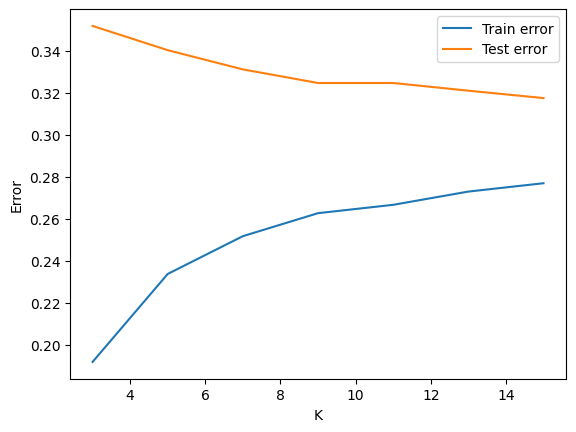

,K,Train Error,Test Error
0,3,0.191710,0.351896
1,5,0.233654,0.340336
2,7,0.251665,0.331172
3,9,0.262627,0.324686
4,11,0.266610,0.324686
5,13,0.321021,0.321021
6,15,0.317496,0.317496


In [ ]:
# Vẽ đồ thị sai số:
import matplotlib.pyplot as plt

plt.plot([3,5,7,9,11,13,15], [train_error_3, train_error_5, train_error_7, train_error_9, train_error_11, train_error_13, train_error_15], label='Train error')
plt.plot([3,5,7,9,11,13,15], [test_error_3, test_error_5, test_error_7, test_error_9, test_error_11, test_error_13, test_error_15], label='Test error')

plt.xlabel('K')
plt.ylabel('Error')
plt.legend()

plt.show()
# Xuất thành dạng bảng:
K_values = [3, 5, 7, 9, 11,13,15]
train_errors = [train_error_3, train_error_5, train_error_7, train_error_9, train_error_11, test_error_13, test_error_15]
test_errors = [test_error_3, test_error_5, test_error_7, test_error_9, test_error_11, test_error_13, test_error_15]

# Tạo dataframe từ các list trên
df_demo = pd.DataFrame({'K': K_values,
                  'Train Error': train_errors,
                  'Test Error': test_errors})

# Xuất dataframe ra file .csv
df_demo

# Xét điểm dữ liệu có Test_error thấp nhất làm K-Best -> xét thêm K=11 để đảm bảo không có giảm thêm!
# => K best = 9


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report
import pandas as pd
from sklearn.model_selection import train_test_split

# Đọc dữ liệu từ tập tin CSV
data1 = selected_df
# Chia dữ liệu thành features (X) và nhãn (y)
# data1.drop("SK_ID_CURR", axis=1, inplace=True)
X = data1.drop("TARGET", axis=1)
y = data1["TARGET"]



# Chia dữ liệu thành tập huấn luyện và tập kiểm tra với tỷ lệ 90% - 10% và đảm bảo tỷ lệ nhãn YES và NO
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

# Khởi tạo mô hình KNN với k=5
knn_model = KNeighborsClassifier(n_neighbors=7)
knn_model.fit(X_train, y_train)

# Dự đoán nhãn cho tập kiểm tra
y_pred = knn_model.predict(X_test)
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)
# # Lưu tập tin TrainData.csv
# train_data.to_csv("TrainData.csv", index=False)

# # Lưu tập tin TestData.csv
# test_data.to_csv("TestData.csv", index=False)

In [ ]:
# Đánh giá mô hình KNN
print("KNN Model Evaluation with k = 11 :")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

KNN Model Evaluation with k = 11 :
[[ 259  779]
 [ 339 2170]]
              precision    recall  f1-score   support

           0       0.43      0.25      0.32      1038
           1       0.74      0.86      0.80      2509

    accuracy                           0.68      3547
   macro avg       0.58      0.56      0.56      3547
weighted avg       0.65      0.68      0.66      3547



In [ ]:
print("KNN Classification Results on New Data:")
print(y_pred)

KNN Classification Results on New Data:
[1 1 1 ... 1 1 1]


In [ ]:
print(y_train)

34784    1
11454    1
7394     0
33290    1
12674    1
        ..
20757    1
32103    1
30403    1
21243    1
2732     0
Name: TARGET, Length: 31917, dtype: int64


In [ ]:
print(y_test)

13020    1
22292    1
22190    1
3941     0
19033    1
        ..
20937    1
3247     0
22538    1
17152    1
27236    1
Name: TARGET, Length: 3547, dtype: int64


In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

# Tạo DataFrame và hiển thị toàn bộ
result_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(result_df)
result_df.to_csv('knn_results.csv', index=False)

       Actual  Predicted
13020       1          1
22292       1          1
22190       1          1
3941        0          1
19033       1          1
...       ...        ...
20937       1          1
3247        0          1
22538       1          1
17152       1          1
27236       1          1

[3547 rows x 2 columns]


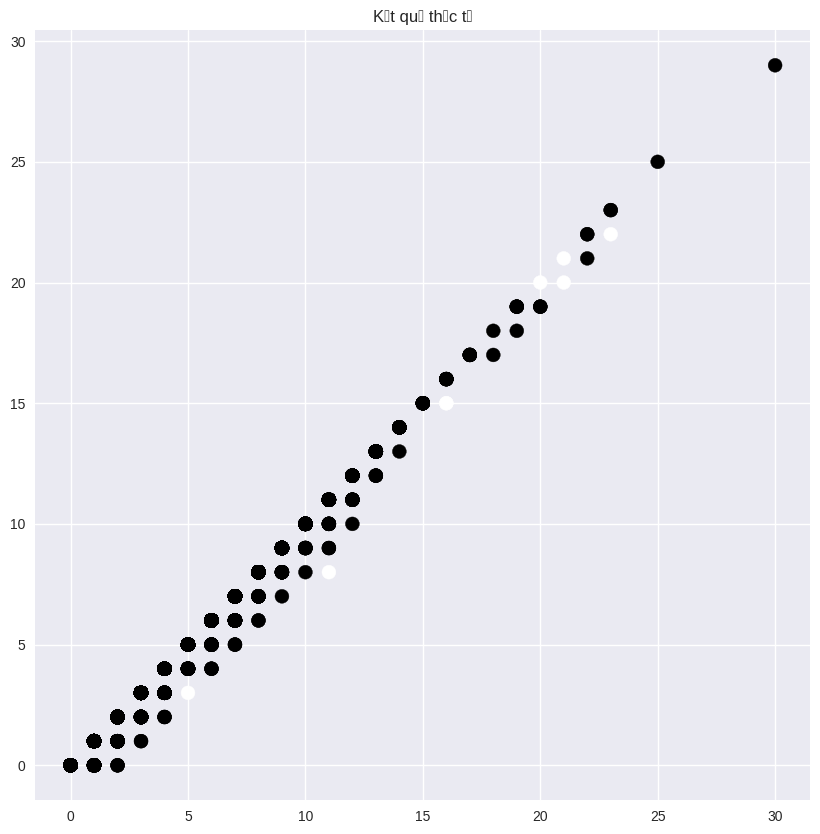

In [ ]:
# truc quan hoa dl voi bo train
plt.style.use('seaborn')

plt.figure(figsize = (10,10))
plt.title('Kết quả thực tế')
plt.scatter(X.iloc[:,0], X.iloc[:,1], c=y,s=100)
plt.show()

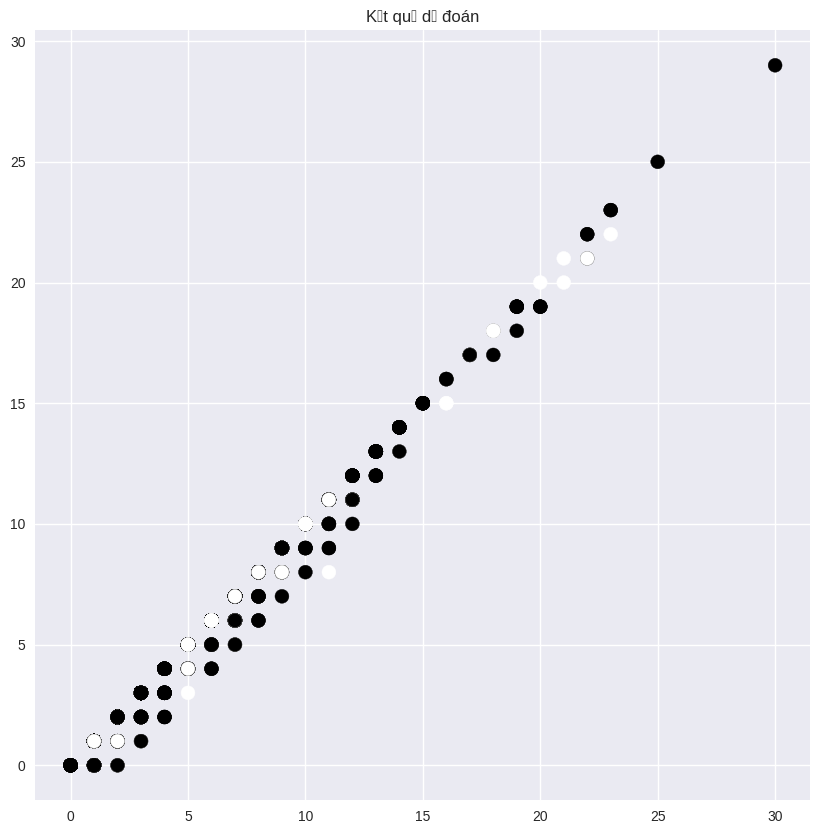

In [ ]:
# truc quan hoa dl voi bo
plt.style.use('seaborn')

plt.figure(figsize = (10,10))
plt.title('Kết quả dự đoán')
plt.scatter(X_train.iloc[:,0], X_train.iloc[:,1], c=y_train,s=100)
plt.show()

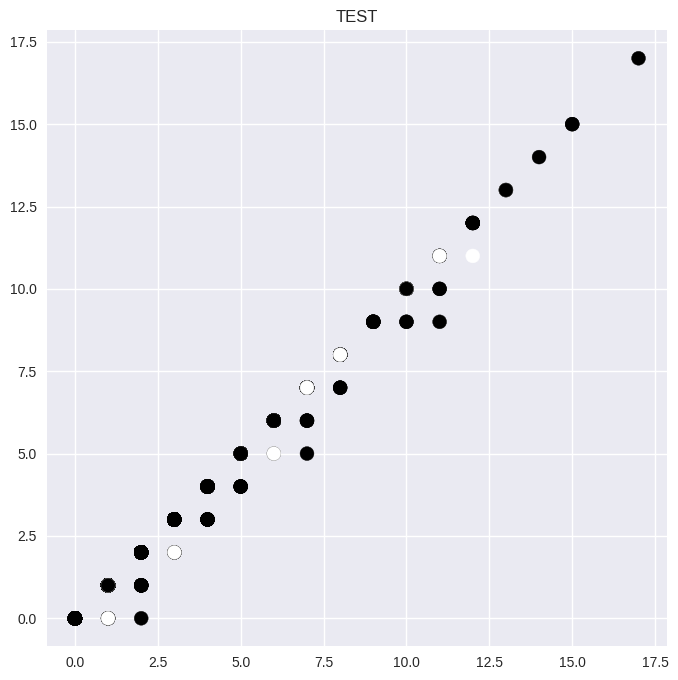

In [ ]:
# truc quan hoa dl voi bo train
plt.style.use('seaborn')

plt.figure(figsize = (8,8))
plt.title('TEST')
plt.scatter(X_test.iloc[:,0], X_test.iloc[:,1], c=y_pred,s=100)
plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Chia tập dữ liệu thành tập train (80%) và tập test (20%):
from sklearn.model_selection import train_test_split

df = bank_data_filtered
#le = LabelEncoder()
#df['Cluster'] = le.fit_transform(df['Cluster']) # Chuẩn hóa cột pep từ YES NO -> 0 1

X = df.drop('TARGET', axis=1)
y = df['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)








In [ ]:
# Xây dựng các mô hình Decision Tree, REP Tree và Random Forest trên tập train với chiều cao cây lần lượt là 4, 5, 6:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier

dt_4 = DecisionTreeClassifier(max_depth=4)
dt_5 = DecisionTreeClassifier(max_depth=5)
dt_6 = DecisionTreeClassifier(max_depth=6)

rep_4 = ExtraTreeClassifier(max_depth=4)
rep_5 = ExtraTreeClassifier(max_depth=5)
rep_6 = ExtraTreeClassifier(max_depth=6)

rf_4 = RandomForestClassifier(max_depth=4)
rf_5 = RandomForestClassifier(max_depth=5)
rf_6 = RandomForestClassifier(max_depth=6)

dt_4.fit(X_train, y_train)
dt_5.fit(X_train, y_train)
dt_6.fit(X_train, y_train)

rep_4.fit(X_train, y_train)
rep_5.fit(X_train, y_train)
rep_6.fit(X_train, y_train)

rf_4.fit(X_train, y_train)
rf_5.fit(X_train, y_train)
rf_6.fit(X_train, y_train)

RandomForestClassifier(max_depth=6)

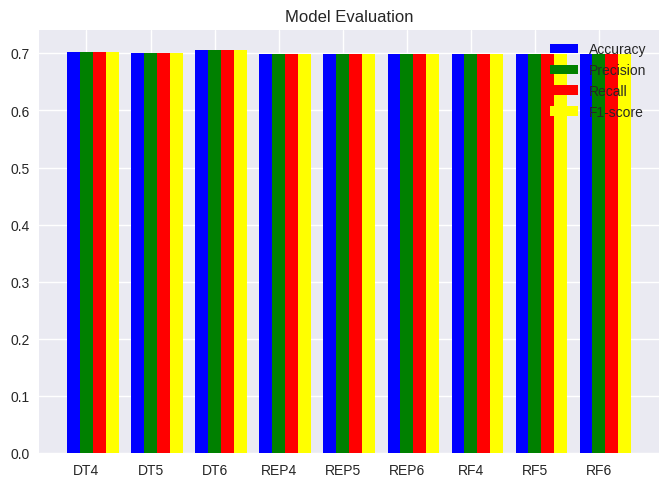

In [ ]:
# Đánh giá các mô hình trên tập test:
y_pred_dt4 = dt_4.predict(X_test)
y_pred_dt5 = dt_5.predict(X_test)
y_pred_dt6 = dt_6.predict(X_test)

y_pred_rep4 = rep_4.predict(X_test)
y_pred_rep5 = rep_5.predict(X_test)
y_pred_rep6 = rep_6.predict(X_test)

y_pred_rf4 = rf_4.predict(X_test)
y_pred_rf5 = rf_5.predict(X_test)
y_pred_rf6 = rf_6.predict(X_test)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

algorithms = ["DT4", "DT5", "DT6", "REP4", "REP5", "REP6", "RF4", "RF5", "RF6"]
accuracies = []
precisions = []
recalls = []
f1_scores = []

for y_pred_ in [y_pred_dt4, y_pred_dt5, y_pred_dt6, y_pred_rep4, y_pred_rep5, y_pred_rep6, y_pred_rf4, y_pred_rf5, y_pred_rf6]:
    accuracies.append(accuracy_score(y_test, y_pred_))
    precisions.append(precision_score(y_test, y_pred_,average='micro'))
    recalls.append(recall_score(y_test, y_pred_,average='micro'))
    f1_scores.append(f1_score(y_test, y_pred_,average='micro'))

x = np.arange(len(algorithms))
width = 0.2

plt.bar(x - 0.2, accuracies, width, label='Accuracy', color='blue')
plt.bar(x, precisions, width, label='Precision', color='green')
plt.bar(x + 0.2, recalls, width, label='Recall', color='red')
plt.bar(x + 0.4, f1_scores, width, label='F1-score', color='yellow')

plt.xticks(x, algorithms)
plt.legend()
plt.title('Model Evaluation')
plt.show()
# Quan sát thấy Accuracy của DT6 cao nhất. REP 5 thấp nhất...

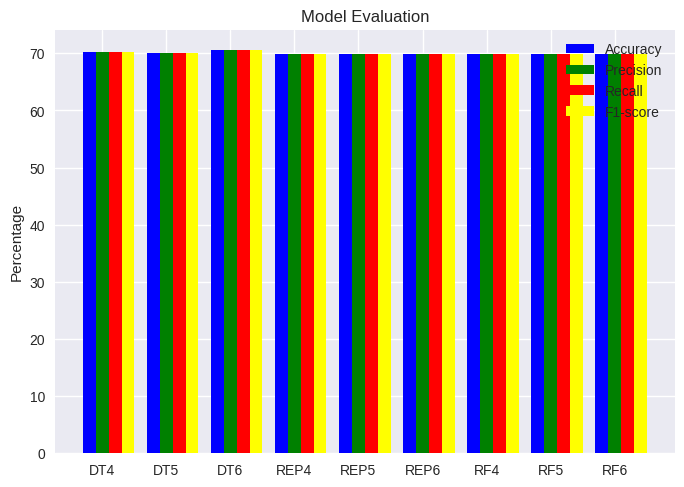

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

algorithms = ["DT4", "DT5", "DT6", "REP4", "REP5", "REP6", "RF4", "RF5", "RF6"]
accuracies = []
precisions = []
recalls = []
f1_scores = []

for y_pred_ in [y_pred_dt4, y_pred_dt5, y_pred_dt6, y_pred_rep4, y_pred_rep5, y_pred_rep6, y_pred_rf4, y_pred_rf5, y_pred_rf6]:
    accuracies.append(accuracy_score(y_test, y_pred_))
    precisions.append(precision_score(y_test, y_pred_, average='micro'))
    recalls.append(recall_score(y_test, y_pred_, average='micro'))
    f1_scores.append(f1_score(y_test, y_pred_, average='micro'))

# Chuyển đổi tỷ lệ từ dạng số sang phần trăm
accuracies = np.array(accuracies) * 100
precisions = np.array(precisions) * 100
recalls = np.array(recalls) * 100
f1_scores = np.array(f1_scores) * 100

x = np.arange(len(algorithms))
width = 0.2

plt.bar(x - 0.2, accuracies, width, label='Accuracy', color='blue')
plt.bar(x, precisions, width, label='Precision', color='green')
plt.bar(x + 0.2, recalls, width, label='Recall', color='red')
plt.bar(x + 0.4, f1_scores, width, label='F1-score', color='yellow')

plt.xticks(x, algorithms)
plt.legend()
plt.title('Model Evaluation')
plt.ylabel('Percentage')
plt.show()


In [ ]:
for algorithm, accuracy, precision, recall, f1_score in zip(algorithms, accuracies, precisions, recalls, f1_scores):
    print(f"{algorithm}:")
    print(f"  Accuracy: {accuracy:.2f}%")
    print(f"  Precision: {precision:.2f}%")
    print(f"  Recall: {recall:.2f}%")
    print(f"  F1-score: {f1_score:.2f}%")
    print("\n")


DT4:
  Accuracy: 70.20%
  Precision: 70.20%
  Recall: 70.20%
  F1-score: 70.20%


DT5:
  Accuracy: 70.09%
  Precision: 70.09%
  Recall: 70.09%
  F1-score: 70.09%


DT6:
  Accuracy: 70.59%
  Precision: 70.59%
  Recall: 70.59%
  F1-score: 70.59%


REP4:
  Accuracy: 69.83%
  Precision: 69.83%
  Recall: 69.83%
  F1-score: 69.83%


REP5:
  Accuracy: 69.92%
  Precision: 69.92%
  Recall: 69.92%
  F1-score: 69.92%


REP6:
  Accuracy: 69.95%
  Precision: 69.95%
  Recall: 69.95%
  F1-score: 69.95%


RF4:
  Accuracy: 69.81%
  Precision: 69.81%
  Recall: 69.81%
  F1-score: 69.81%


RF5:
  Accuracy: 69.89%
  Precision: 69.89%
  Recall: 69.89%
  F1-score: 69.89%


RF6:
  Accuracy: 69.95%
  Precision: 69.95%
  Recall: 69.95%
  F1-score: 69.95%




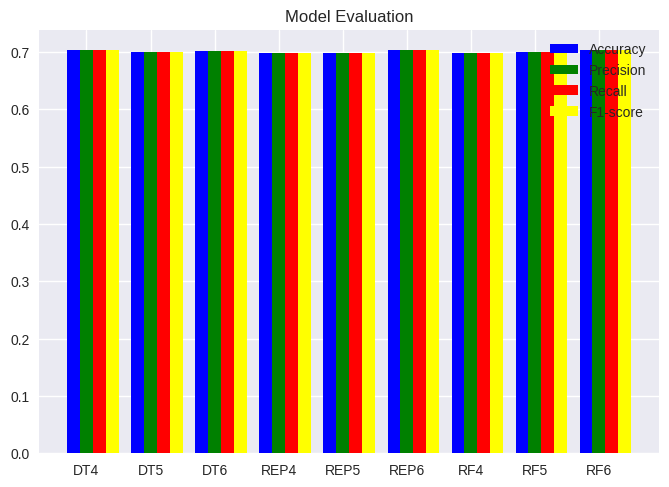

In [ ]:
# Chọn 7 features quan trọng:
from sklearn.feature_selection import SelectKBest, f_classif

selector = SelectKBest(f_classif, k=7)
selector.fit(X_train, y_train)

X_train_reduced = selector.transform(X_train)
X_test_reduced = selector.transform(X_test)

# Huấn luyện và đánh giá lại các mô hình trên tập dữ liệu đã giảm chiều:
dt_4.fit(X_train_reduced, y_train)
dt_5.fit(X_train_reduced, y_train)
dt_6.fit(X_train_reduced, y_train)

rep_4.fit(X_train_reduced, y_train)
rep_5.fit(X_train_reduced, y_train)
rep_6.fit(X_train_reduced, y_train)

rf_4.fit(X_train_reduced, y_train)
rf_5.fit(X_train_reduced, y_train)
rf_6.fit(X_train_reduced, y_train)

# Đánh giá lại các mô hình trên tập test:
y_pred_dt4 = dt_4.predict(X_test_reduced)
y_pred_dt5 = dt_5.predict(X_test_reduced)
y_pred_dt6 = dt_6.predict(X_test_reduced)

y_pred_rep4 = rep_4.predict(X_test_reduced)
y_pred_rep5 = rep_5.predict(X_test_reduced)
y_pred_rep6 = rep_6.predict(X_test_reduced)

y_pred_rf4 = rf_4.predict(X_test_reduced)
y_pred_rf5 = rf_5.predict(X_test_reduced)
y_pred_rf6 = rf_6.predict(X_test_reduced)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

algorithms = ["DT4", "DT5", "DT6", "REP4", "REP5", "REP6", "RF4", "RF5", "RF6"]
accuracies = []
precisions = []
recalls = []
f1_scores = []

for y_pred_ in [y_pred_dt4, y_pred_dt5, y_pred_dt6, y_pred_rep4, y_pred_rep5, y_pred_rep6, y_pred_rf4, y_pred_rf5, y_pred_rf6]:
    accuracies.append(accuracy_score(y_test, y_pred_))
    precisions.append(precision_score(y_test, y_pred_,average='micro'))
    recalls.append(recall_score(y_test, y_pred_,average='micro'))
    f1_scores.append(f1_score(y_test, y_pred_,average='micro'))

x = np.arange(len(algorithms))
width = 0.2

plt.bar(x - 0.2, accuracies, width, label='Accuracy', color='blue')
plt.bar(x, precisions, width, label='Precision', color='green')
plt.bar(x + 0.2, recalls, width, label='Recall', color='red')
plt.bar(x + 0.4, f1_scores, width, label='F1-score', color='yellow')

plt.xticks(x, algorithms)
plt.legend()
plt.title('Model Evaluation')
plt.show()

In [ ]:
selected_features = X_train.columns[selector.get_support()]
print("Selected Features:", selected_features)


Selected Features: Index(['CODE_GENDER', 'NAME_EDUCATION_TYPE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'DAYS_LAST_PHONE_CHANGE'],
      dtype='object')


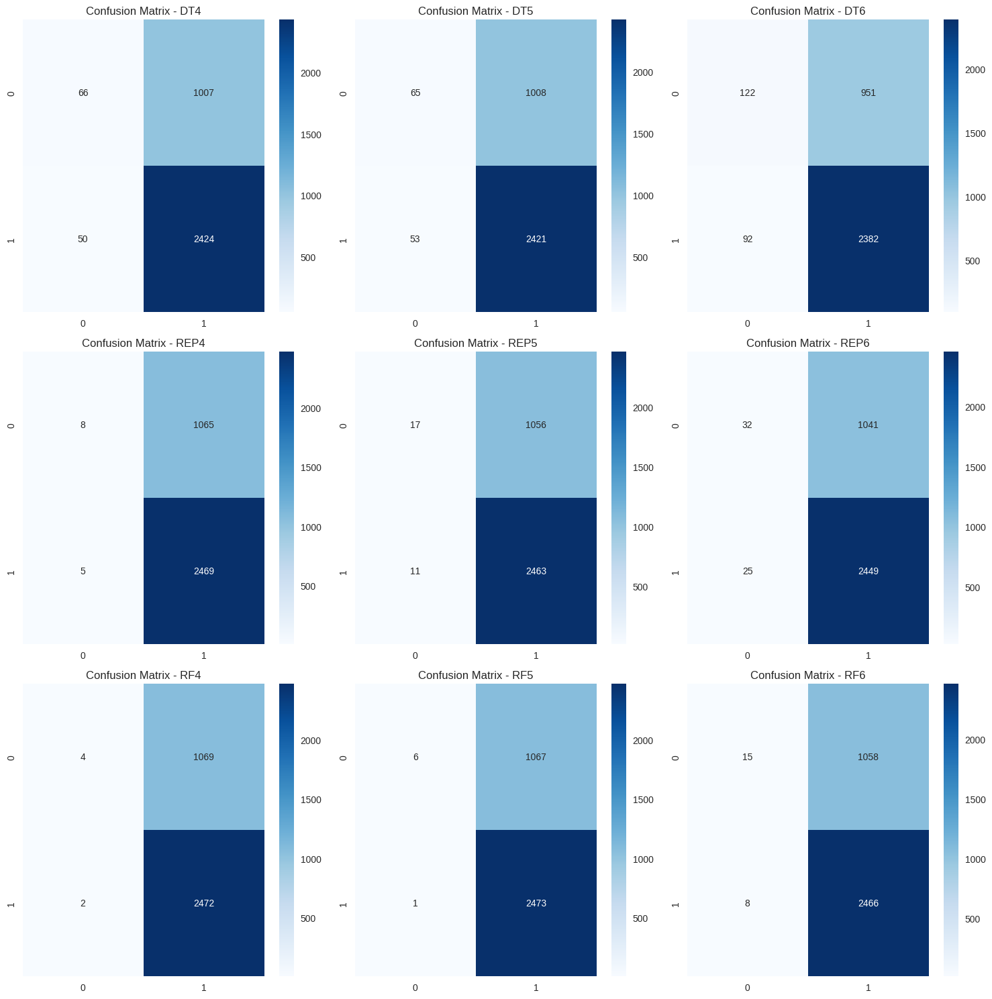

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

conf_matrices = []

for y_pred_ in [y_pred_dt4, y_pred_dt5, y_pred_dt6, y_pred_rep4, y_pred_rep5, y_pred_rep6, y_pred_rf4, y_pred_rf5, y_pred_rf6]:
    conf_matrix = confusion_matrix(y_test, y_pred_)
    conf_matrices.append(conf_matrix)

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))

for i, ax in enumerate(axes.flat):
    sns.heatmap(conf_matrices[i], annot=True, fmt="d", cmap="Blues", ax=ax)
    ax.set_title(f"Confusion Matrix - {algorithms[i]}")

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
from sklearn.metrics import confusion matrix, classification report
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_text
from sklearn.tree import export_graphviz
import graphviz

# Chọn các cột đặc trưng và cột nhãn
features = selected_df[['OBS_30_CNT_SOCIAL_CIRCLE',
'OBS_60_CNT_SOCIAL_CIRCLE',
'AMT_CREDIT',
'AMT_GOODS_PRICE',
'REGION_RATING_CLIENT_W_CITY',
'REGION_RATING_CLIENT',
'CNT_CHILDREN',
'CNT_FAM_MEMBERS',
'LIVE_REGION_NOT_WORK_REGION',
'REG_REGION_NOT_WORK_REGION',
'DEF_30_CNT_SOCIAL_CIRCLE',
'DEF_60_CNT_SOCIAL_CIRCLE',
'LIVE_CITY_NOT_WORK_CITY',
'REG_CITY_NOT_WORK_CITY',
'AMT_ANNUITY',
'DAYS_EMPLOYED',
'DAYS_BIRTH', 'ORGANIZATION_TYPE']]

labels = selected_df['TARGET']

# # Chuyển đổi các cột dữ liệu dạng văn bản thành dạng số (phải thực hiện để huấn luyện mô hình)
# features = pd.get_dummies(features)
# features

# Tách dữ liệu thành hai tập Train và Test
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size=0.2, random_state=42)

SyntaxError: invalid syntax (<ipython-input-40-df4a11c2362b>, line 2)

In [ ]:
# Xây dựng mô hình Cây quyết định (J48) và định nghĩa các giá trị tham số cần thử nghiệm
param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
# Tạo mô hình Cây quyết định (J48)
clf = DecisionTreeClassifier()

# Sử dụng GridSearchCV để thử nghiệm các tham số và lựa chọn mô hình tốt nhất
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(train_features, train_labels)

# Lựa chọn mô hình tốt nhất sau khi thử nghiệm
best_clf = grid_search.best_estimator_

# In ra các thông số tốt nhất của mô hình
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'splitter': 'random'}
Best Accuracy: 0.6968737218536054


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import graphviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Tạo một mô hình cây quyết định mới
clf = DecisionTreeClassifier()

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
train_features, test_features, train_labels, test_labels = train_test_split(X, y, test_size=0.2, random_state=42)

# Huấn luyện mô hình trên tập huấn luyện
clf.fit(train_features, train_labels)

# Dự đoán nhãn cho tập kiểm tra
Y_pred = clf.predict(test_features)

# Đánh giá mô hình cây quyết định
print("Decision Tree Model Evaluation:")
print(confusion_matrix(test_labels, Y_pred))
print(classification_report(test_labels, Y_pred))


Decision Tree Model Evaluation:
[[ 773 1372]
 [1409 3539]]
              precision    recall  f1-score   support

           0       0.35      0.36      0.36      2145
           1       0.72      0.72      0.72      4948

    accuracy                           0.61      7093
   macro avg       0.54      0.54      0.54      7093
weighted avg       0.61      0.61      0.61      7093



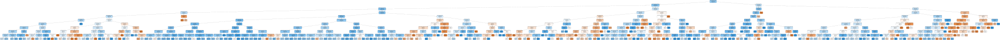

In [ ]:
# import pandas as pd
# from sklearn.model_selection import train_test_split, GridSearchCV
# from sklearn.tree import DecisionTreeClassifier, export_text, export_graphviz
# from IPython.display import display
# import graphviz

# # (Code để load và tiền xử lý dữ liệu đã được bỏ qua)

# # Tạo mô hình Cây quyết định (J48)
# clf = DecisionTreeClassifier()

# Định nghĩa các giá trị tham số cần thử nghiệm với các giả định đã được đề cập
param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8]
}

# # Sử dụng GridSearchCV để thử nghiệm các tham số và lựa chọn mô hình tốt nhất
# grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
# grid_search.fit(train_features, train_labels)

# # Lựa chọn mô hình tốt nhất sau khi thử nghiệm
# best_clf = grid_search.best_estimator_

# # In ra các thông số tốt nhất của mô hình
# print("Best Parameters:", grid_search.best_params_)
# print("Best Accuracy:", grid_search.best_score_)

# # Hiển thị cây quyết định trên màn hình
# tree_rules = export_text(best_clf, feature_names=list(features.columns))
# print(tree_rules)

# Vẽ cây quyết định
dot_data = export_graphviz(best_clf, out_file=None,
                           feature_names=list(features.columns),
                           class_names=['0', '1'],
                           filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
display(graph)


|--- DAYS_EMPLOYED <= 19302.25
|   |--- AMT_GOODS_PRICE <= 1003856.81
|   |   |--- REGION_RATING_CLIENT <= 1.48
|   |   |   |--- DAYS_EMPLOYED <= 10742.54
|   |   |   |   |--- DAYS_EMPLOYED <= 2290.48
|   |   |   |   |   |--- CNT_FAM_MEMBERS <= 4.18
|   |   |   |   |   |   |--- AMT_GOODS_PRICE <= 539155.41
|   |   |   |   |   |   |   |--- DEF_60_CNT_SOCIAL_CIRCLE <= 0.82
|   |   |   |   |   |   |   |   |--- REG_CITY_NOT_WORK_CITY <= 0.72
|   |   |   |   |   |   |   |   |   |--- AMT_ANNUITY <= 16614.65
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- AMT_ANNUITY >  16614.65
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- REG_CITY_NOT_WORK_CITY >  0.72
|   |   |   |   |   |   |   |   |   |--- ORGANIZATION_TYPE <= 33.93
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- ORGANIZATION_TYPE >  33.93
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   

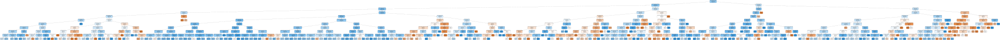

In [ ]:
# Tạo mô hình Cây quyết định (J48) với max_depth giảm xuống
clf = DecisionTreeClassifier(max_depth=1)

# # Sử dụng GridSearchCV để thử nghiệm các tham số và lựa chọn mô hình tốt nhất
# grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
# grid_search.fit(train_features, train_labels)

# # Lựa chọn mô hình tốt nhất sau khi thử nghiệm
# best_clf = grid_search.best_estimator_

# # In ra các thông số tốt nhất của mô hình
# print("Best Parameters:", grid_search.best_params_)
# print("Best Accuracy:", grid_search.best_score_)

# Hiển thị cây quyết định trên màn hình
tree_rules = export_text(best_clf, feature_names=list(features.columns))
print(tree_rules)

# Vẽ cây quyết định
dot_data = export_graphviz(best_clf, out_file=None,
                           feature_names=list(features.columns),
                           class_names=['0', '1'],
                           filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
display(graph)


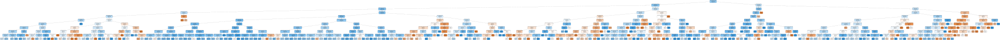

In [ ]:
dot_data = export_graphviz(best_clf, out_file=None,
                           feature_names=list(features.columns),
                           class_names=['0', '1'],
                           filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
display(graph)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.782365 to fit


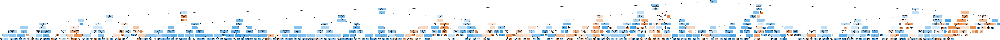

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
from IPython.display import Image

# Vẽ cây quyết định
dot_data = tree.export_graphviz(best_clf, out_file=None,
                                feature_names=train_features.columns,
                                class_names=['0', '1'],
                                filled=True, rounded=True,
                                special_characters=True)

graph = graphviz.Source(dot_data)
graph.render("decision_tree")  # Lưu cây quyết định vào file 'decision_tree.pdf'
graph.render("decision_tree", format="png", cleanup=True)  # Lưu cây quyết định vào file 'decision_tree.png'

# Hiển thị cây quyết định trực tiếp trên màn hình
Image(filename='decision_tree.png')


In [ ]:
# In ra các thông số tốt nhất của mô hình
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

# Vẽ cây quyết định
dot_data = export_graphviz(best_clf, out_file=None,
                           feature_names=train_features.columns,
                           class_names=['0', '1'],
                           filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
graph.render("decision_tree")

# Hiển thị cây quyết định trực tiếp trên màn hình
graph.view()


Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'splitter': 'random'}
Best Accuracy: 0.6968737218536054


'decision_tree.pdf'

In [ ]:
# Vẽ cây quyết định bằng graphviz
dot_data = export_graphviz(best_clf, out_file=None,
                           feature_names=features.columns,
                           class_names=['0', '1'],
                           filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
graph.render("decision_tree")

# Mở file hình cây quyết định
graph.view("decision_tree")


'decision_tree.pdf'

In [ ]:
# Vẽ cây quyết định và lưu vào file
dot_data = export_graphviz(best_clf, out_file=None, feature_names=features.columns, class_names=['0', '1'],
                           filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
graph.render("decision_tree")

# Hiển thị cây quyết định trực tiếp trong notebook (yêu cầu cài đặt thư viện pygraphviz)
# graph

# Lưu cây quyết định dưới dạng hình ảnh (yêu cầu cài đặt thư viện pygraphviz)
# graph.format = 'png'
# graph.render("decision_tree_image")

# In cây quyết định ra màn hình (dùng cho môi trường không hỗ trợ hiển thị hình ảnh)
print(export_text(best_clf, feature_names=list(features.columns)))


|--- DAYS_EMPLOYED <= 19302.25
|   |--- AMT_GOODS_PRICE <= 1003856.81
|   |   |--- REGION_RATING_CLIENT <= 1.48
|   |   |   |--- DAYS_EMPLOYED <= 10742.54
|   |   |   |   |--- DAYS_EMPLOYED <= 2290.48
|   |   |   |   |   |--- CNT_FAM_MEMBERS <= 4.18
|   |   |   |   |   |   |--- AMT_GOODS_PRICE <= 539155.41
|   |   |   |   |   |   |   |--- DEF_60_CNT_SOCIAL_CIRCLE <= 0.82
|   |   |   |   |   |   |   |   |--- REG_CITY_NOT_WORK_CITY <= 0.72
|   |   |   |   |   |   |   |   |   |--- AMT_ANNUITY <= 16614.65
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- AMT_ANNUITY >  16614.65
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- REG_CITY_NOT_WORK_CITY >  0.72
|   |   |   |   |   |   |   |   |   |--- ORGANIZATION_TYPE <= 33.93
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- ORGANIZATION_TYPE >  33.93
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   

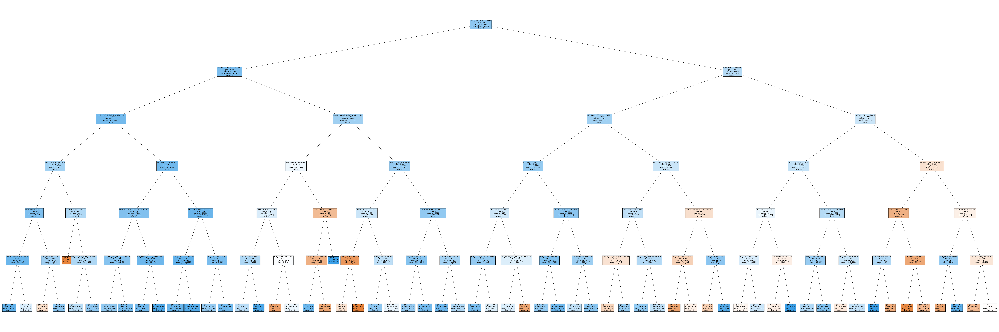

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

X = selected_df.drop('TARGET', axis=1)
y = selected_df['TARGET']

clf = DecisionTreeClassifier(max_depth=6)
clf.fit(X, y)

plt.figure(figsize=(150,50))
plot_tree(clf, filled=True, feature_names=X.columns, class_names=['0','1'], fontsize=12)
plt.show()